# <center><b> Trends in Brisbane City Council Libraries </b></center>
### <center><b> Data from Jan 2024 to July 2025 </b></center>

#### **Introduction**
-----

The Brisbane City Council records data on items checked out at the various libraries within the council borders which can be found on the council's [open data website](https://data.brisbane.qld.gov.au/pages/home/). The data is available for public use under the [Creative Commons 4.0 licence](https://creativecommons.org/licenses/by/4.0/). The goal of this case study is to identify trends within the data and highlight typical library use by the public. Such trends may indicate successes of current library initiatives or suggest possible changes required to better serve the public.

This case study uses the python language for data manipulation and will begin by importing the required modules.

In [1]:
# Import packages to be used
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import seaborn.objects as so
import plotly.express as px
import plotly.graph_objects as go

The general library data contains two columns containing library referencing values, this information is unnecessary for this case study and will be excluded to reduce the size of the dataset. The data will be imported into separate dataframes for the 2024 and 2025 data. 

In [2]:
# Create a list of the columns to load in
col_names = ["Title", "Author", "Item Type", "Language", "Age", "Checkout Library"]

# Import base library data for 2025
lib2025 = pd.read_csv("library-checkouts-2025.csv", usecols = col_names, dtype = {"Title": str,
                                                                                  "Author": str,
                                                                                  "Item Type": str,
                                                                                  "Language": str,
                                                                                  "Age": str,
                                                                                  "Checkout Library": str})

In [3]:
# Import base library data for 2024
lib2024 = pd.read_csv("library-checkouts-2024.csv", usecols = col_names, dtype = {"Title": str,
                                                                                  "Author": str,
                                                                                  "Item Type": str,
                                                                                  "Language": str,
                                                                                  "Age": str,
                                                                                  "Checkout Library": str})

The library data uses acronyms to identify libraries and item types that will make interpretation quite cumbersome. Thankfully, the council includes a speadsheet with acronym definitions on their website. These definitions will be loaded into a dictionary so they can be applied to the dataset to replace the acronyms with their corresponding definition.

In [4]:
# Library data uses acronyms, need to read in acronym definitions
# and set up as a dictionary for mapping to the dataframe
lib_names = pd.read_csv("library-dataset-acronyms.csv", usecols = ["Branch Code", "Branch Heading"])

names_dict = dict(zip(lib_names["Branch Code"].tolist(), lib_names["Branch Heading"].tolist()))

In [5]:
# Create item type dictionary for mapping
type_names = pd.read_csv("library-dataset-acronyms.csv", usecols = ["Item Type Code", "Item Type Explanation"])

types_dict = dict(zip(type_names["Item Type Code"].tolist(), type_names["Item Type Explanation"].tolist()))

Brisbane City Council also records geographic information about each library which will be useful for map visuals.

In [6]:
# Read in geographic data for the libraries and format to match the other dataframes
lib_geo = pd.read_csv("Libraries-Information-Location.csv", usecols = ["Venue", "Latitude", "Longitude", "Parking", "geolocation"])

# Remove "library" at the end of each location to match the other dataframes
lib_geo["Venue"] = lib_geo["Venue"].str.rstrip("Library").str.strip()

# Add a full stop after Mt for the three Mt libraries so it matches the other dataframes
lib_geo.replace({"Venue":{"Mt Ommaney": "Mt. Ommaney"}}, inplace = True)

lib_geo.replace({"Venue":{"Mt Coot-tha": "Mt. Coot-tha"}}, inplace = True)

lib_geo.replace({"Venue":{"Mt Gravatt": "Mt. Gravatt"}}, inplace = True)

# Put "library" back on the Brisbane Square entry to match the other dataframes
lib_geo.replace({"Venue":{"Brisbane Square": "Brisbane Square Library"}}, inplace = True)

# Rename the Venue column to Checkout Library to make merging easier
lib_geo.rename(columns = {"Venue": "Checkout Library"}, inplace = True)

The data includes information about the language of each item checked out. The brisbane city council keeps certain amounts of "LOTE" (Languages other than english) material at certain libraries around brisbane. Information about how many LOTE items are kept at each library as well as the total number of items (LOTE and non-LOTE) at each library will be useful for analysis and this can be obtained by using the [Brisbane City Council Library Catalogue](https://library-brisbane.ent.sirsidynix.net.au/client/en_AU/eLibCat).

In [7]:
# Total LOTE items dataframe
total_items = pd.read_csv("Brisbane-Library-Items.csv")

There are six columns in the main datasets consisting of Title, Author, Item Type, Language, Age, and Checkout Library. As usual, Title and Author are the names of the item and the person who created it. Item Type details what kind of item is checked out (eg paperback, magazine, DVD). Language refers to the language the item is in. Age represents intended audience for the item and is split into Adult, Young Adult, and Juvenile. Lastly, Checkout Library refers to which library the item was checked out from.

#### **Data Cleaning and Preparation**

----

Some basic information about the 2024 dataset can be seen below.

In [8]:
# Check basic info for dataset
lib2024.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 579911 entries, 0 to 579910
Data columns (total 6 columns):
 #   Column            Non-Null Count   Dtype 
---  ------            --------------   ----- 
 0   Title             579910 non-null  object
 1   Author            497364 non-null  object
 2   Item Type         579911 non-null  object
 3   Language          13070 non-null   object
 4   Age               579911 non-null  object
 5   Checkout Library  579911 non-null  object
dtypes: object(6)
memory usage: 26.5+ MB


In [9]:
# check number of null values
lib2024.isna().sum()

Title                    1
Author               82547
Item Type                0
Language            566841
Age                      0
Checkout Library         0
dtype: int64

There are a number of null values within the dataset. The City Council decided to record any item in english as null in the Language column which is why that column has so many null values in particular. The only other columns containing null values are Title and Author. It is more useful to keep the rows with null values and simply replace the null with a set value so trends in the other columns can still be observed. The null values will be replaced by the phrase "POLICY NOT FOUND" as this appears to be used within the dataset as a null replacement already. 

In [10]:
# The null values can all be replaced with a default value
lib2025 = lib2025.fillna("POLICY NOT FOUND")

lib2024 = lib2024.fillna("POLICY NOT FOUND")

In [11]:
# Check dataframe layout
lib2024.tail()

,Title,Author,Item Type,Language,Age,Checkout Library
579906,Once upon a time in Hollywood,POLICY NOT FOUND,DVD,POLICY NOT FOUND,ADULT,BRR
579907,The only girl in town /,"Condie, Allyson Braithwaite,",YA-FICTION,POLICY NOT FOUND,YA,SBK
579908,Problem at Pollensa Bay and other stories /,"Christie, Agatha,",AD-PBK,POLICY NOT FOUND,ADULT,CDE
579909,Tender is the night ; a romance /,"Fitzgerald, F. Scott (Francis Scott),",AD-PBK,POLICY NOT FOUND,ADULT,CDE
579910,Mystical mushrooms : discover the magic & folk...,"Kane, Aurora,",NONFICTION,POLICY NOT FOUND,ADULT,IPY


As seen above, the Title column includes a "/" at the end of a number of titles. Investigating further there are also instances in the Title column where the word "FASTBACK" is placed before the title even though the item type already provides the fastback labelling. The Author field is also inconsistent on the last character with some having a comma, some a period, and some having neither a comma or period. 

Both the 2024 and 2025 data need to be standardised so that the Title and Author columns are formatted consistently. The Item Type and Checkout Library columns need to be updated with the previously developed acronym definitions to make the dataset more readable.

In [12]:
# Create function to remove the slashes, periods, or commas at the very end of the titles and authors
def clean_cols(var):
    if var[-1] == "/":
        var = var[:-1]
    elif var[-1] == ".":
        var = var[:-1]
    elif var[-1] == ",":
        var = var[:-1]
    return var

In [13]:
# Create a function that removes "FASTBACK" from the title since that information is already in the Item Type
def remove_fastback(var):
    if "FASTBACK" in var:
        var = var[11:]
    return var

In [14]:
# Remove the slashes from the Titles
lib2024["Title"] = lib2024["Title"].apply(clean_cols).apply(remove_fastback)\
.str.strip().str.title().replace("Policy Not Found", "POLICY NOT FOUND")

# Remove commas and periods at the end of Author first names
lib2024["Author"] = lib2024["Author"].apply(clean_cols)\
.str.strip().str.title().replace("Policy Not Found", "POLICY NOT FOUND")

# Apply the dictionaries to the acronym heavy columns, and remove whitespace following transformations
lib2024["Item Type"] = lib2024["Item Type"].map(types_dict).str.strip().fillna("POLICY NOT FOUND")

lib2024["Checkout Library"] = lib2024["Checkout Library"].map(names_dict).str.strip()

lib2024 = lib2024.dropna()

In [15]:
# Remove the slashes from the Titles
lib2025["Title"] = lib2025["Title"].apply(clean_cols).apply(remove_fastback)\
.str.strip().str.title().replace("Policy Not Found", "POLICY NOT FOUND")

# Remove commas and periods at the end of Author first names
lib2025["Author"] = lib2025["Author"].apply(clean_cols)\
.str.strip().str.title().replace("Policy Not Found", "POLICY NOT FOUND")

# Apply the dictionaries to the acronym columns, remove whitespace, and manage null values generated following transformations
lib2025["Item Type"] = lib2025["Item Type"].map(types_dict).str.strip().fillna("POLICY NOT FOUND")

lib2025["Checkout Library"] = lib2025["Checkout Library"].map(names_dict).str.strip()

lib2025 = lib2025.dropna()

In [16]:
# Check changes
lib2024.tail()

,Title,Author,Item Type,Language,Age,Checkout Library
579906,Once Upon A Time In Hollywood,POLICY NOT FOUND,DVD,POLICY NOT FOUND,ADULT,Bracken Ridge
579907,The Only Girl In Town,"Condie, Allyson Braithwaite",Young Adult Fiction,POLICY NOT FOUND,YA,Sunnybank Hills
579908,Problem At Pollensa Bay And Other Stories,"Christie, Agatha",Adult Paperback,POLICY NOT FOUND,ADULT,Chermside
579909,Tender Is The Night ; A Romance,"Fitzgerald, F. Scott (Francis Scott)",Adult Paperback,POLICY NOT FOUND,ADULT,Chermside
579910,Mystical Mushrooms : Discover The Magic & Folk...,"Kane, Aurora",Non Fiction,POLICY NOT FOUND,ADULT,Indooroopilly


With the null values managed, the columns standardized, and the acronyms replaced the data is in a usable and readable format.  

#### **Clustering**

----

The data can now be used to investigate trends in how the public uses the libraries. As a starting point it would be useful to group libraries together based on similarities which can then be explored. A clustering algorithm is a good method to find patterns within the data and group similar libraries accordingly. 

Since the data is predominantly categorical it needs to be transformed into counts of occurrences for the clustering to provide meaningful results. The categories will also need to be combined together to reduce the dimensionality of the data being clustered which should also improve results. The Item Type column contains many values like "Adult Fiction" and "Junior Fiction" that can be combined into just "Fiction" while not losing any clustering potential since the Age column still separates these into "Adult" and Juvenile". There are many LOTE item types this can apply similarly to as well with the Language column providing the separation.

In [17]:
# Function to reduce the dimension of the item type column
def reduce_item_dim(val):
    if val == "Languages Other than English Picture Book":
        val = "Picture Book"
    elif "Mt Coot-tha" in val:
        val = "Mt Coot-tha Item"
    elif ("Magazine" in val) & ("Mt Coot-tha" not in val):
        val = "Magazines"
    elif val == "FastBack Kids":
        val = "Fastback"
    elif ("Fiction" in val) & ("Non" not in val):
        val = "Fiction"
    elif "Paperback" in val:
        val = "Paperback"
    elif ("DVD" in val) & ("Mt Coot-tha" not in val):
        val = "DVD"
    elif (val == "Non Fiction Set") | (val == "Languages Other than English Non Fiction Book"):
        val = "Non Fiction"
    elif val == "Literacy Audio Visual":
        val = "Literacy"
    elif "Graphic Novel" in val:
        val = "Graphic Novel"
    elif "Biography" in val:
        val = "Biography"
    elif "Board Book" in val:
        val = "Board book"
    elif (val == "Languages Other than English Taped Book") | (val == "Languages Other than English Reader"):
        val = "Languages Other than English Book"
    elif ("CD" in val) | ("Compact Disc" in val):
        val = "CD"
    return val

A K-Means clustering algorithm will be used to group the libraries. To determine the appropriate number of groups a clustering algoritm will be created for the range of 2 clusters right through to 30 clusters. Since there are only 33 libraries this range is honestly more than necessary and is sure contain the optimum number of clusters. Inertia and Silhouette scores will be calculated for each clustering algorithm in the range and these metrics will indicate the appropriate number of clusters.

In [18]:
# import dependencies for clustering
import sklearn.metrics as metrics
import sklearn.cluster as cluster
import sklearn.decomposition as decomp

In [19]:
# create a function that calculates the inertia for a range of values of k
def kmeans_inertia(num_clusters, x_vals):
    inertia = []
    for num in num_clusters:
        km = cluster.KMeans(n_clusters = num, random_state = 0)
        km.fit(x_vals)
        inertia.append(km.inertia_)
    return inertia

In [20]:
# create a function that calculates the silhouette score for a range of values of k
def kmeans_sil(num_clusters, x_vals):
    sil = []
    for num in num_clusters:
        km = cluster.KMeans(n_clusters = num, random_state = 0)
        km.fit(x_vals)
        sil.append(metrics.silhouette_score(x_vals, km.labels_))
    return sil

In [21]:
# Create a variable for the range of cluster numbers to test for
num_clusters = [i for i in range(2, 31)]

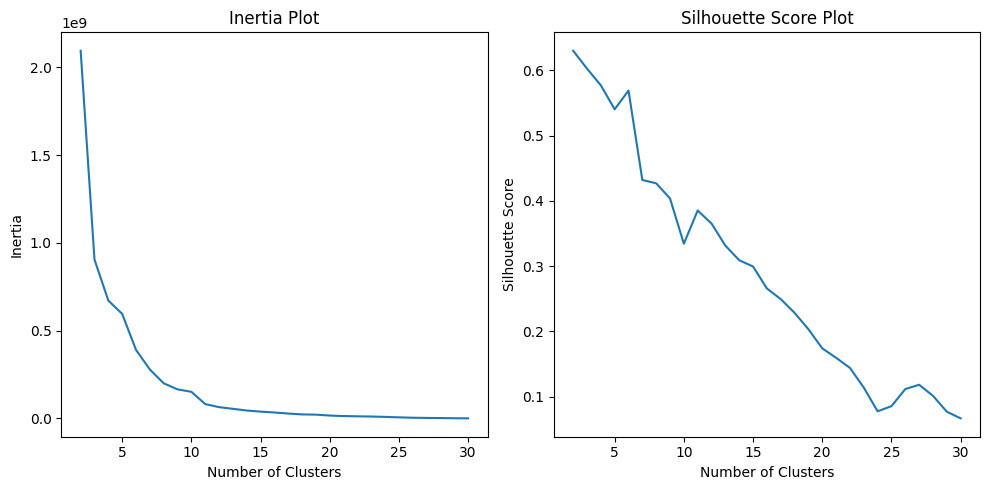

In [22]:
# Copy the main dataframe to preserve the original and apply the 
# Dimension reduction function in preparation for clustering
lib_cluster2024 = lib2024.copy().drop(["Title", "Author"], axis = 1)

lib_cluster2024["Item Type"] = lib_cluster2024["Item Type"].astype(str).apply(reduce_item_dim)

# Alter the new dataframe so that it displays the Checkout Library column
# Followed by columns for each categorical value in the other variables with 
# The number of counts of each categorical value as the column values
lib_cluster2024 = pd.concat([lib_cluster2024[["Checkout Library"]], 
                             pd.get_dummies(lib_cluster2024[["Item Type", "Language", "Age"]]).astype(int)], 
                             axis = 1)

lib_cluster2024 = lib_cluster2024.groupby("Checkout Library").sum().reset_index()

# Create a separate dataframe with the checkout library column dropped
# So it contains only the numerical data
lib_cluster_final2024 = lib_cluster2024.drop("Checkout Library", axis = 1)

# Generate inertia and silhouette scores over the range of values previously set
inertia_cluster2024 = kmeans_inertia(num_clusters, lib_cluster_final2024)

silhouette_cluster2024 = kmeans_sil(num_clusters, lib_cluster_final2024)

# Set up plots for Inertia and Silhouette score to show side by side
clus_fig, clus_ax = plt.subplots(1,2, figsize = (10,5))

clus_ax[0].plot(num_clusters, inertia_cluster2024)
clus_ax[0].set_xlabel("Number of Clusters")
clus_ax[0].set_ylabel("Inertia")
clus_ax[0].set_title("Inertia Plot")

clus_ax[1].plot(num_clusters, silhouette_cluster2024)
clus_ax[1].set_xlabel("Number of Clusters")
clus_ax[1].set_ylabel("Silhouette Score")
clus_ax[1].set_title("Silhouette Score Plot")

plt.tight_layout()

plt.show()

The Inertia and Silhouette scores suggest that 6 clusters would be an appropriate grouping since six is both a higher value than most in the Silhouette score plot and is around the middle of the "elbow" of the Inertia plot. Using Principle Component Analysis (PCA) the data can be reduced to two dimensions so the clustering can be visualized.

In [23]:
# Run K-Means clustering for 6 clusters and fit it to the data
km_2024 = cluster.KMeans(n_clusters = 6, random_state = 0)

km_2024.fit(lib_cluster_final2024)

# Add a column in the cluster dataframe that contains the cluster labels 
# For each library
lib_cluster2024["Cluster"] = km_2024.labels_.astype(str)

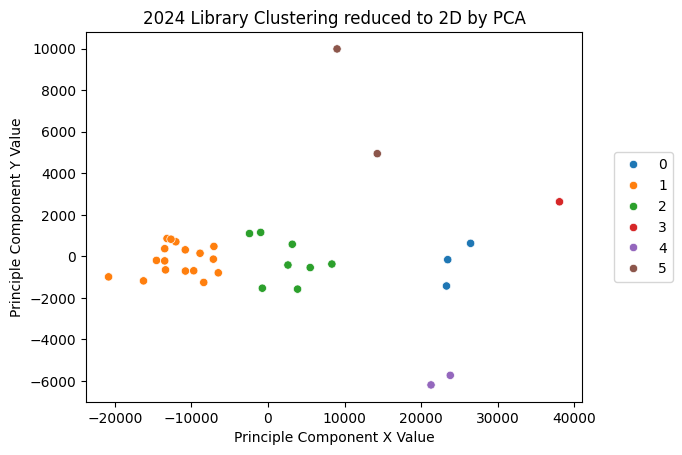

In [24]:
# Run Principle Component Analysis to reduce the data to two dimensions 
# So it can be plotted on a scatter graph
pca = decomp.PCA(n_components=2, n_oversamples = 30, random_state=0)
lib_cluster_pca = pca.fit_transform(lib_cluster_final2024)

# Separate the two dimensions out of the PCA result with one dimension
# As the X axis value and the other dimension as the Y axis value
x_val = []
y_val = []
for val in lib_cluster_pca:
    x_val.append(val[0])
    y_val.append(val[1])

# Create a list to order the graph legend numerically
cluster_order = [str(i) for i in range(6)]

# Create a scatter plot of the PCA data
sns.scatterplot(x = x_val, y = y_val, hue = lib_cluster2024["Cluster"], hue_order = cluster_order)
plt.legend(loc='center left', bbox_to_anchor=(1.05, 0.5))
plt.xlabel("Principle Component X Value")
plt.ylabel("Principle Component Y Value")
plt.title("2024 Library Clustering reduced to 2D by PCA")
plt.show()

The visual suggests that 6 clusters is reasonable with the points grouped fairly well. The two brown points towards the top of the visual (representing Brisbane Square Library and Wynnum Library) seem the most spaced out group, while the far left yellow group has two points (Annerley and Mt Coot-tha libraries) separated from the main compact grouping.

The grouping appears reasonable and will be applied to the 2024 data henceforth. The process will be repeated for the 2025 data which will also allow for comparison between the years.

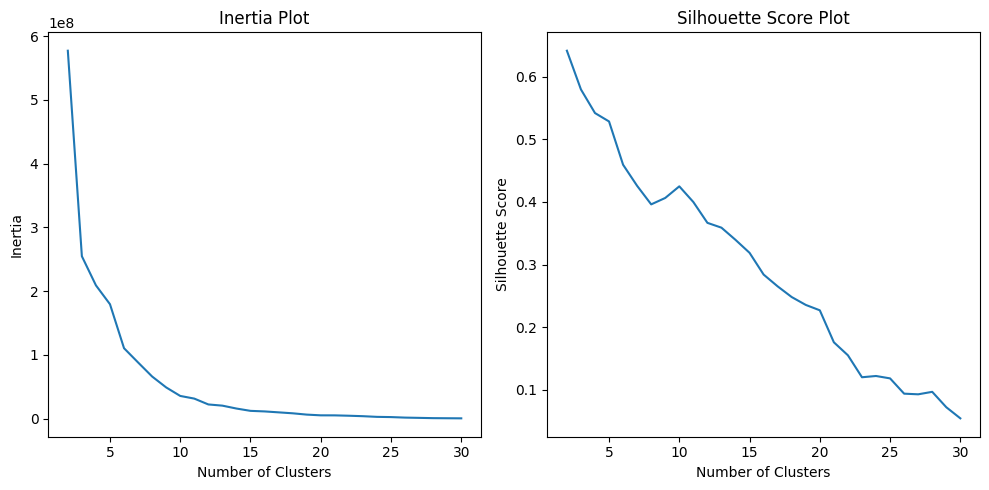

In [25]:
# Copy the main dataframe to preserve the original and apply the 
# Dimension reduction function in preparation for clustering
lib_cluster2025 = lib2025.copy().drop(["Title", "Author"], axis = 1)

lib_cluster2025["Item Type"] = lib_cluster2025["Item Type"].astype(str).apply(reduce_item_dim)

# Alter the new dataframe so that it displays the Checkout Library column
# Followed by columns for each categorical value in the other variables with 
# The number of counts of each categorical value as the column values
lib_cluster2025 = pd.concat([lib_cluster2025[["Checkout Library"]], 
                             pd.get_dummies(lib_cluster2025[["Item Type", "Language", "Age"]]).astype(int)], 
                             axis = 1)

lib_cluster2025 = lib_cluster2025.groupby("Checkout Library").sum().reset_index()

# Create a separate dataframe with the checkout library column dropped
lib_cluster_final2025 = lib_cluster2025.drop("Checkout Library", axis = 1)

# Generate inertia and silhouette scores over the range of values previously set
inertia_cluster2025 = kmeans_inertia(num_clusters, lib_cluster_final2025)

silhouette_cluster2025 = kmeans_sil(num_clusters, lib_cluster_final2025)

# Set up plots for Inertia and Silhouette score to show side by side
clus_fig, clus_ax = plt.subplots(1,2, figsize = (10,5))

clus_ax[0].plot(num_clusters, inertia_cluster2025)
clus_ax[0].set_xlabel("Number of Clusters")
clus_ax[0].set_ylabel("Inertia")
clus_ax[0].set_title("Inertia Plot")

clus_ax[1].plot(num_clusters, silhouette_cluster2025)
clus_ax[1].set_xlabel("Number of Clusters")
clus_ax[1].set_ylabel("Silhouette Score")
clus_ax[1].set_title("Silhouette Score Plot")

plt.tight_layout()

plt.show()

In [26]:
# Run K-Means clustering for 6 clusters and fit it to the data
km_2025 = cluster.KMeans(n_clusters = 6, random_state = 0)

km_2025.fit(lib_cluster_final2025)

# Add a column in the cluster dataframe that contains the cluster labels 
# For each library
lib_cluster2025["Cluster"] = km_2025.labels_.astype(str)

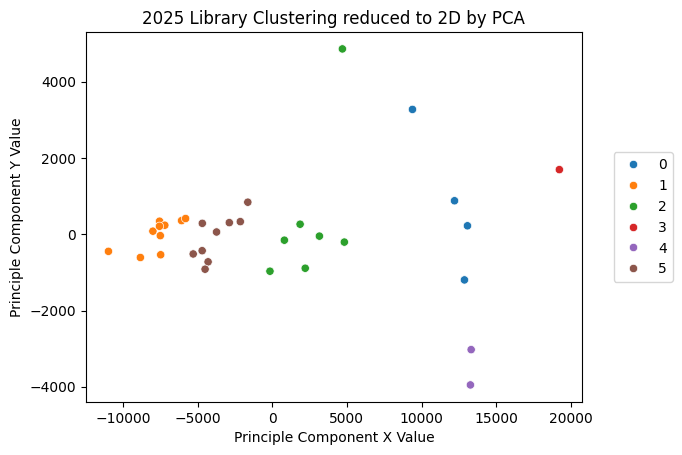

In [27]:
# Run Principle Component Analysis to reduce the data to two dimensions 
# So it can be plotted on a scatter graph
pca = decomp.PCA(n_components=2, n_oversamples = 30, random_state=0)
lib_cluster_pca2025 = pca.fit_transform(lib_cluster_final2025)

# Separate the two dimensions out of the PCA result with one dimension
# As the X axis value and the other dimension as the Y axis value
x_val2025 = []
y_val2025 = []
for val in lib_cluster_pca2025:
    x_val2025.append(val[0])
    y_val2025.append(val[1])

# Create a list to order the graph legend numerically
cluster_order = [str(i) for i in range(6)]

# Create a scatter plot of the PCA data
sns.scatterplot(x = x_val2025, y = y_val2025, hue = lib_cluster2025["Cluster"], hue_order = cluster_order)
plt.legend(loc='center left', bbox_to_anchor=(1.05, 0.5))
plt.xlabel("Principle Component X Value")
plt.ylabel("Principle Component Y Value")
plt.title("2025 Library Clustering reduced to 2D by PCA")
plt.show()

The Inertia and Silhouette scores again suggest 6 clusters would be appropraite but the grouping is different to the 2024 data. The compact yellow grouping on the left side of the 2024 visual is more spread out in the 2025 visual which has resulted in the algorithm prefering to break the far left grouing into two groups. 

The other grouping that was changed from 2024 is the brown grouping at the top of the 2024 visual. The 2025 visual has separated the Brisbane Square Library and Wynnum Library data points and placed them into the green and blue clusters. This has caused the Brisbane Square Library data point (top most data point) to be very far from its assigned group.

If you apply the same clustering from the 2024 to the 2025 data (as seen below) it is quickly visible that the yellow and green groupings do not work well on the 2025 data. In particular the green data points for the Mitchelton and Fairfield libraries are much closer to the yellow cluster than to the rest of the green cluster. Splitting the yellow and green groups to form 3 clusters instead of 2 better fits the 2025 data.

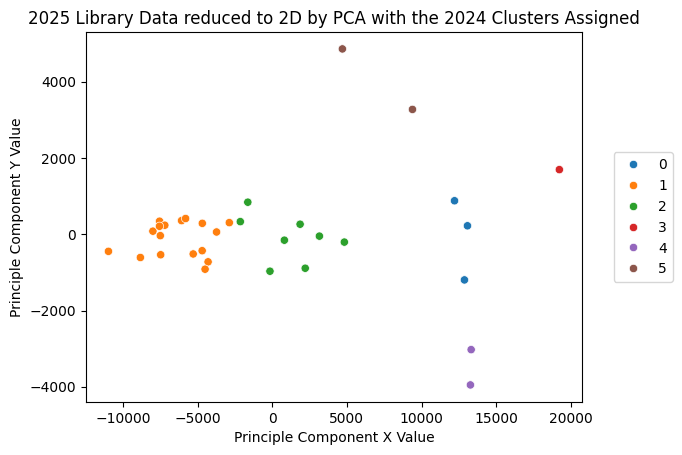

In [28]:
# Create a list to order the graph legend numerically
cluster_order = [str(i) for i in range(6)]

# Create a scatter plot of the PCA data for 2025 with the 2024 cluster groups applied
sns.scatterplot(x = x_val2025, y = y_val2025, hue = lib_cluster2024["Cluster"], hue_order = cluster_order)
plt.legend(loc='center left', bbox_to_anchor=(1.05, 0.5))
plt.xlabel("Principle Component X Value")
plt.ylabel("Principle Component Y Value")
plt.title("2025 Library Data reduced to 2D by PCA with the 2024 Clusters Assigned")
plt.show()

#### **Analysis**

----

**Checkouts:**

With the libraries clustered into different groups, comparisons can be made between libraries and library groups. Plotting the libraries on a map visual that groups the libraries by their assigned cluster will show where similar libraries are in relation to one another. Altering the size of the marker for each library on the map to proportionally match the number of items checked out at each library will also provide insight into hot spots for activity within Brisbane City.  

In [29]:
# Create new dataframes with the geographic data and cluster values merged in
lib_geo2024 = lib2024["Checkout Library"].value_counts().reset_index()\
.merge(lib_geo, on = "Checkout Library", how = "inner")\
.merge(lib_cluster2024[["Checkout Library", "Cluster"]], on = "Checkout Library", how = "inner")

lib_geo2025 = lib2025["Checkout Library"].value_counts().reset_index()\
.merge(lib_geo, on = "Checkout Library", how = "inner")\
.merge(lib_cluster2025[["Checkout Library", "Cluster"]], on = "Checkout Library", how = "inner")


In [30]:
# MAP VISUAL FOR 2024 DATA

# Create a variable to order groups in the legend numerically
cluster_order = [str(i) for i in range(6)]

# Create a Scatter Map plot of the libraries
a = px.scatter_map(lib_geo2024, 
                   lat="Latitude", 
                   lon="Longitude", 
                   color = "Cluster", 
                   size = "count", 
                   color_discrete_sequence = px.colors.qualitative.Light24,
                   category_orders = {"Cluster": cluster_order},
                   map_style = "dark", 
                   zoom=10.6, 
                   height=1000, 
                   width = 1000,
                   title = "Count of Checkouts by Library for 2024"
                  )

# Create a variable representing the dataframe for all libraries except Annerley and West End
text_above2024 = lib_geo2024[(lib_geo2024["Checkout Library"] != "Annerley") | (lib_geo2024["Checkout Library"] != "West End")]

# Add a text layer to the Scatter Map that labels the libraries with their name above the corresponding marker (except for Annerley and West End)
a.add_trace(go.Scattermap(lat = text_above2024["Latitude"].add(0.006), 
                          lon = text_above2024["Longitude"], 
                          mode = "text", 
                          text = text_above2024["Checkout Library"], 
                          textfont = {"color": "yellow", "size": 10}, 
                          hoverinfo = "none", 
                          showlegend = False
                         ))

# Create a variable representing the dataframe for only Annerley and West End libraries
text_below2024 = lib_geo2024[(lib_geo2024["Checkout Library"] == "Annerley") | (lib_geo2024["Checkout Library"] == "West End")]

# Add a text layer to the Scatter Map that labels only Annerley and West End libraries with their name below the corresponding marker
a.add_trace(go.Scattermap(lat = text_below2024["Latitude"].sub(0.006), 
                          lon = text_below2024["Longitude"], 
                          mode = "text", 
                          text = text_below2024["Checkout Library"], 
                          textfont = {"color": "yellow", "size": 10}, 
                          hoverinfo = "none", 
                          showlegend = False
                         ))

In [31]:
# MAP VISUAL FOR 2025 DATA

# Create a variable to order groups in the legend numerically
cluster_order = [str(i) for i in range(6)]

# Create a Scatter Map plot of the libraries
a = px.scatter_map(lib_geo2025, 
                   lat="Latitude", 
                   lon="Longitude", 
                   color = "Cluster", 
                   size = "count", 
                   color_discrete_sequence = px.colors.qualitative.Light24,
                   category_orders = {"Cluster": cluster_order},
                   map_style = "dark", 
                   zoom=10.6, 
                   height=1000, 
                   width = 1000,
                   title = "Count of Checkouts by Library for 2025"
                  )

# Create a variable representing the dataframe for all libraries except Annerley and West End
text_above2025 = lib_geo2025[(lib_geo2025["Checkout Library"] != "Annerley") | (lib_geo2025["Checkout Library"] != "West End")]

# Add a text layer to the Scatter Map that labels the libraries with their name above the corresponding marker (except for Annerley and West End)
a.add_trace(go.Scattermap(lat = text_above2025["Latitude"].add(0.006), 
                          lon = text_above2025["Longitude"], 
                          mode = "text", 
                          text = text_above2025["Checkout Library"], 
                          textfont = {"color": "yellow", "size": 10}, 
                          hoverinfo = "none", 
                          showlegend = False
                         ))

# Create a variable representing the dataframe for only Annerley and West End libraries
text_below2025 = lib_geo2025[(lib_geo2025["Checkout Library"] == "Annerley") | (lib_geo2025["Checkout Library"] == "West End")]

# Add a text layer to the Scatter Map that labels only Annerley and West End libraries with their name below the corresponding marker
a.add_trace(go.Scattermap(lat = text_below2025["Latitude"].sub(0.006), 
                          lon = text_below2025["Longitude"], 
                          mode = "text", 
                          text = text_below2025["Checkout Library"], 
                          textfont = {"color": "yellow", "size": 10}, 
                          hoverinfo = "none", 
                          showlegend = False
                         ))

The visual above shows the contrasting number of checkouts for each library by the size of the circle representing the library and the 2024 and 2025 visual have their respective clustering applied to group the libraries into different colours. 

It would seem that the primary factor in the X value for the previously shown PCA clustering visuals is the number of checkouts for each library since clusters 1 and 2 (and 5 for 2025) represented the large number of points bunched up towards the left end of the X axis on the clustering graphs while here, on the map graphs, they are the smaller circles (fewer checkouts). On the far right side of the clustering visuals was always the single data point of group 3, here on the map we see it representing the Chermside Library which consistently has the largest circle (most checkouts). A table is provided below with the specific checkout numbers for each library for both years. 

The clustering therefore shows that the larger libraries have greater variance with one another, resulting in the different groups and large space between groups on the right side of the clustering visuals. In comparison the left side of the clustering visuals were more bunched together suggesting that the smaller libraries are comparatively more similar to each other.

It is interesting that Sunnybank Hills and Garden City have similar checkout counts to Ashgrove, Carindale, and Indooroopilly but they are always placed in their own group yet they are geographically close to each other as well. This possibly suggests a difference in this region of the city that isn't observed elsewhere.

In [32]:
# Table of checkout count values for 2024 and 2025
lib2024["Checkout Library"].value_counts().reset_index().merge(
    lib2025["Checkout Library"].value_counts().reset_index(), 
    on = "Checkout Library", 
    how = "inner", 
    suffixes = ("_2024", "_2025")
)

,Checkout Library,count_2024,count_2025
0,Chermside,47730,25165
1,Ashgrove,37808,19008
2,Sunnybank Hills,37578,20811
3,Indooroopilly,36243,20120
4,Carindale,35589,19609
5,Garden City,35177,20440
6,Wynnum,28730,17188
7,Brisbane Square Library,26739,14830
8,Kenmore,23560,12988
9,Mt. Ommaney,21741,11982


**Age:**

The next variable to compare between libraries and groups is the Age variable. While the actual age of people checking out books is not recorded in the data, some inferences can be made from the intended audience for each item which is separated into Adult, Young Adult, and Juvenile. 

The distribution of checked out items between these three categories can show whether most libraries have similar usage or whether certain libraries have higher checkout proportions of one of the age groups. If there are any differences it will be important to note whether the differences are shared amongst a clustering group.

In [33]:
# Create Dataframes for 2024 and 2025 formatted to graph age distributions for checkouts

lib_graph2025 = lib2025.groupby("Checkout Library")["Age"].value_counts(normalize = True, sort = False).reset_index()

lib_graph2024 = lib2024.groupby("Checkout Library")["Age"].value_counts(normalize = True, sort = False).reset_index()

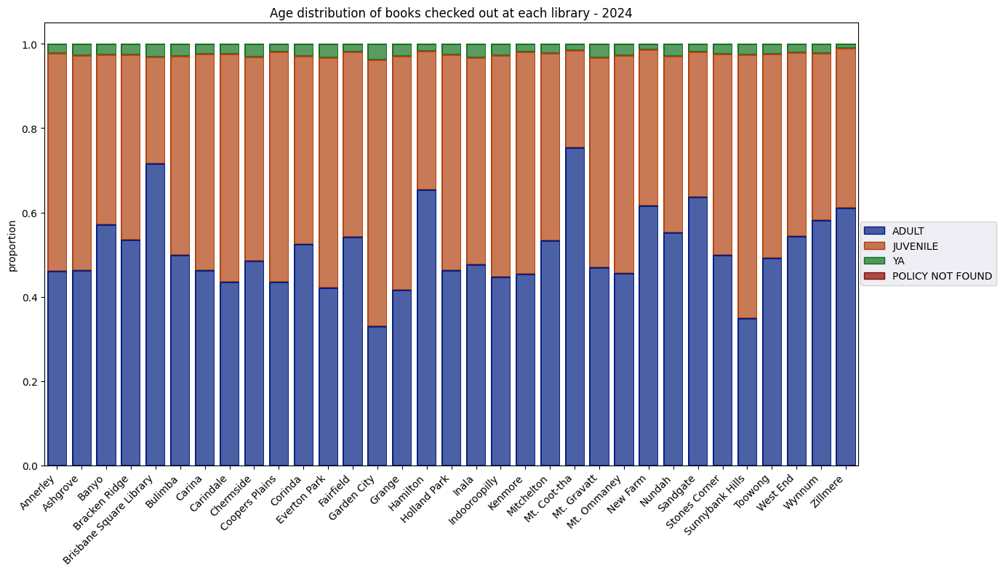

In [34]:
# Create a graph object of a stacked bar graph for the age distribution
p = so.Plot(lib_graph2024, x = "Checkout Library", y = "proportion", color = "Age").\
add(so.Bar(), so.Stack()).scale(color = "dark").layout(engine = "tight").theme({"legend.fontsize": "small"}).\
label(title = "Age distribution of books checked out at each library - 2024", x = "", color = "")

# Generate a blank figure and axis of set size to plot the graph object onto
plt.figure(figsize = (12,8))

ax = plt.gca()

# Rotate and align the x axis labels
plt.xticks(rotation = 45, ha = "right")

# Plot the graph object on the generated axis
p.on(ax).plot();

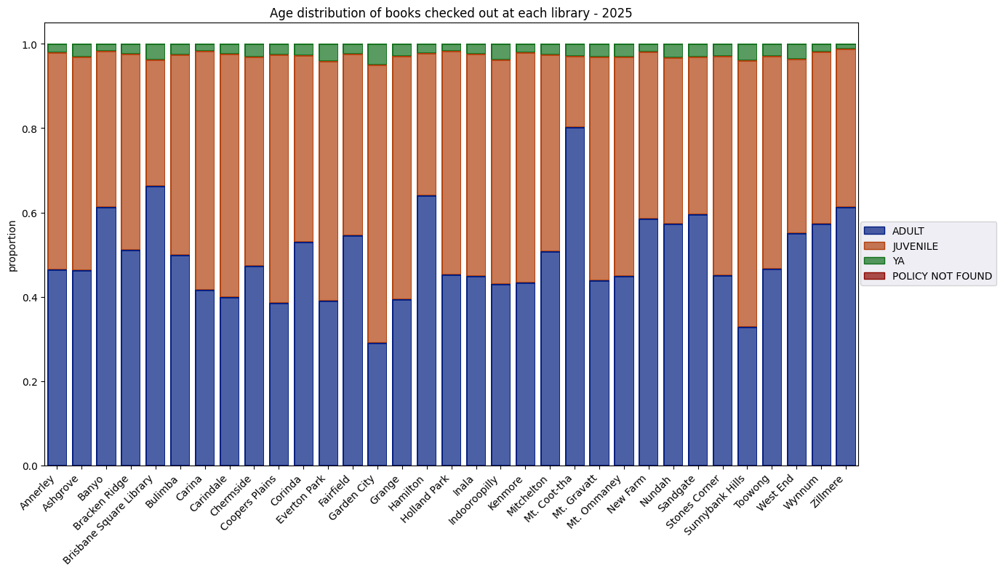

In [35]:
# Create a graph object of a stacked bar graph for the age distribution
p = so.Plot(lib_graph2025, x = "Checkout Library", y = "proportion", color = "Age").\
add(so.Bar(), so.Stack()).scale(color = "dark").layout(engine = "tight").theme({"legend.fontsize": "small"}).\
label(title = "Age distribution of books checked out at each library - 2025", x = "", color = "")

# Generate a blank figure and axis of set size to plot the graph object onto
plt.figure(figsize = (12,8))

ax = plt.gca()

# Rotate and align the x axis labels
plt.xticks(rotation = 45, ha = "right")

# Plot the graph object on the generated axis
p.on(ax).plot();

The visuals above show the distributions as a proportion of the total items checked out (ie 1.0 = 100% of items, 0.4 = 40% of items). The 2024 and 2025 proportions are quite similar, there are differences between each library however. The vast majority of libraries fall between 0.4 and 0.6 for Adult checkouts but there are some notable exceptions.

The Young Adult category consistently makes up the smallest portion. This is most likely due to the narrower age range of this group in comparison to Juvenile and Adult which likely results in fewer items belonging to the Young Adult category. Data on the actual age of people checking out items would need to be collected to determine if this is the cause or whether Young Adults are less likely to use a Library.

The two libraries with the lowest Adult checkout proportions are Sunnybank Hills and Garden City which we know are part of the same cluster. This higher proportion of Juvenile checkouts is likely part of why these two libraries are separated from the Carindale, Ashgrove, Indooroopilly library cluster (cluster number 0). This difference can clearly be seen when visualizing the same data by library cluster (Sunnybank Hills and Garden City belong to cluster number 4).

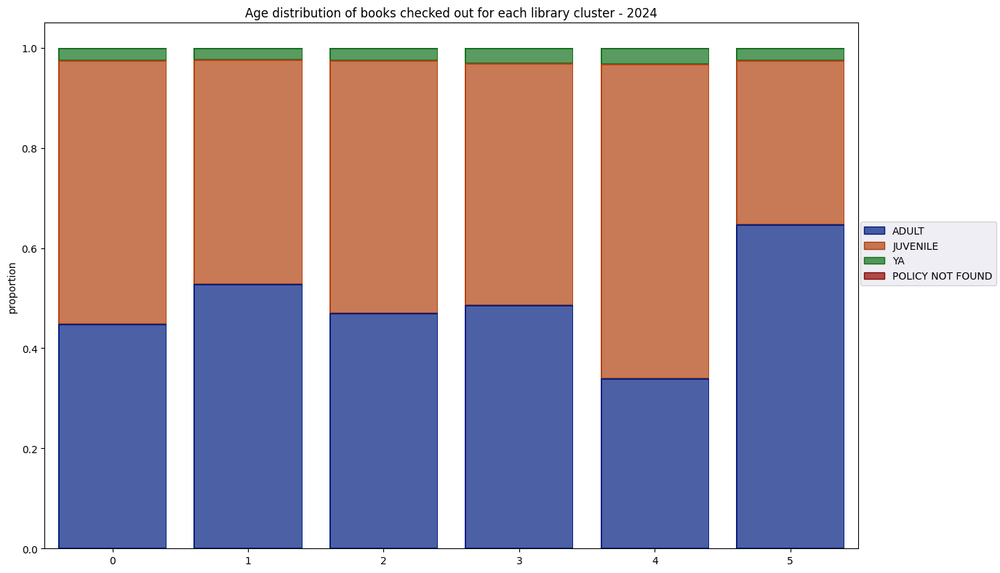

In [36]:
# Create the same distribution graph but grouped by library cluster instead of individual library
lib_graph2024_cluster = lib2024.merge(lib_cluster2024[["Checkout Library", "Cluster"]], on = "Checkout Library", how = "inner").\
groupby("Cluster")["Age"].value_counts(normalize = True, sort = False).reset_index()

p = so.Plot(lib_graph2024_cluster, x = "Cluster", y = "proportion", color = "Age").\
add(so.Bar(), so.Stack()).scale(color = "dark").layout(engine = "tight").theme({"legend.fontsize": "small"}).\
label(title = "Age distribution of books checked out for each library cluster - 2024", x = "", color = "")

plt.figure(figsize = (12,8))

ax = plt.gca()

p.on(ax).plot();

Along with cluster 4 having higher Juvenile items, cluster 5 is shown to have a higher Adult proportion and (for the 2024 data) is made up of the Brisbane Square Library and the Wynnum library. However, when comparing the individual libraries there are other libraries with higher Adult proportions (Mt Coot-tha for example). This increased proportion is likely part of what separates these two libraries from the Carindale, Ashgrove, Indooroopilly group but it doesn't seem to be the only factor determining the Y axis value of the clustering visuals since it isn't reflected in the Y value for the smaller libraries.

**Item Type:**

Another factor considered in the clustering is the Item Type. A dot plot can be seen below comparing the number of counts of each item type for libraries in clusters 0, 4, and 5. 

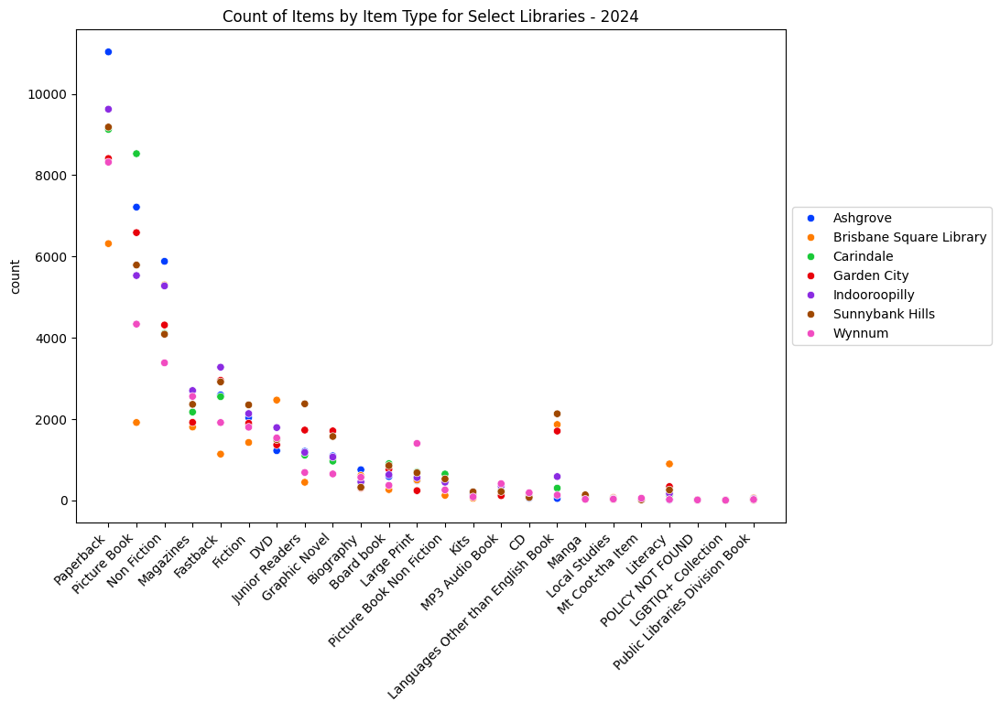

In [37]:
# Create a dataframe formatted to graph item types for specific libraries
lib_item2024 = lib2024.copy()

lib_item2024["Item Type"] = lib_item2024["Item Type"].apply(reduce_item_dim)

lib_item2024 = lib_item2024.groupby("Checkout Library")["Item Type"].value_counts().reset_index()\
.merge(lib_cluster2024[["Checkout Library", "Cluster"]], on = "Checkout Library", how = "inner")

# Dot plot of item type counts for specific libraries
plt.figure(figsize = (10,7))

item_graph = sns.scatterplot(lib_item2024[lib_item2024["Cluster"].isin(["0","4","5"])], 
                             x = "Item Type", 
                             y = "count", 
                             hue = "Checkout Library", 
                             palette = "bright")

plt.title("Count of Items by Item Type for Select Libraries - 2024")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.xticks(rotation = 45, ha = "right")
plt.xlabel(None)
plt.show()

Based on clustering you would expect Ashgrove, Carindale, and Indooroopilly to (on average) be closer together, Sunnybank Hills and Garden City should also be similar, and Brisbane Square and Wynnum should be different again. 

It does appear that Brisbane Square Library in particular has a significantly different distribution to the other libraries - especially for the item types with higher counts. Wynnum also diverges in a simiar fashion to Brisbane Square but not as excessively which keeps with the clustering visuals from earlier that showed Brisbane Square at the very top of the graph with Wynnum inbetween Brisbane Square and Cluster number 0 (Ashgrove, Carindale and Indooroopilly). 

It is interesting to note that one of the types that Wynnum diverges on is the Large Print item type where it has around double the next highest. This may play part of why Wynnum has a higher than average Adult proportion as this may indicate a higher proportion of senior citizens who have difficulty reading normal print. More specific data would need to be collected to confirm this theory.

Outside of the LOTE Book category, there isn't a large difference between the libraries belonging to Cluster 0 and those belonging to Cluster 4 (Sunnybank Hills and Garden City). This suggests that Cluster 4 diverges mostly on Age (as previously discussed) and on Language.

It is worth comparing the difference between these clusters with the differences between the smaller libraries that belong to the same cluster. The clustering visuals grouped these libraries more tightly so it is expected that the differences between libraries should not be so great among these clusters. The dot plots for these Clusters will be placed on the same scale as the previous graph for comparison.

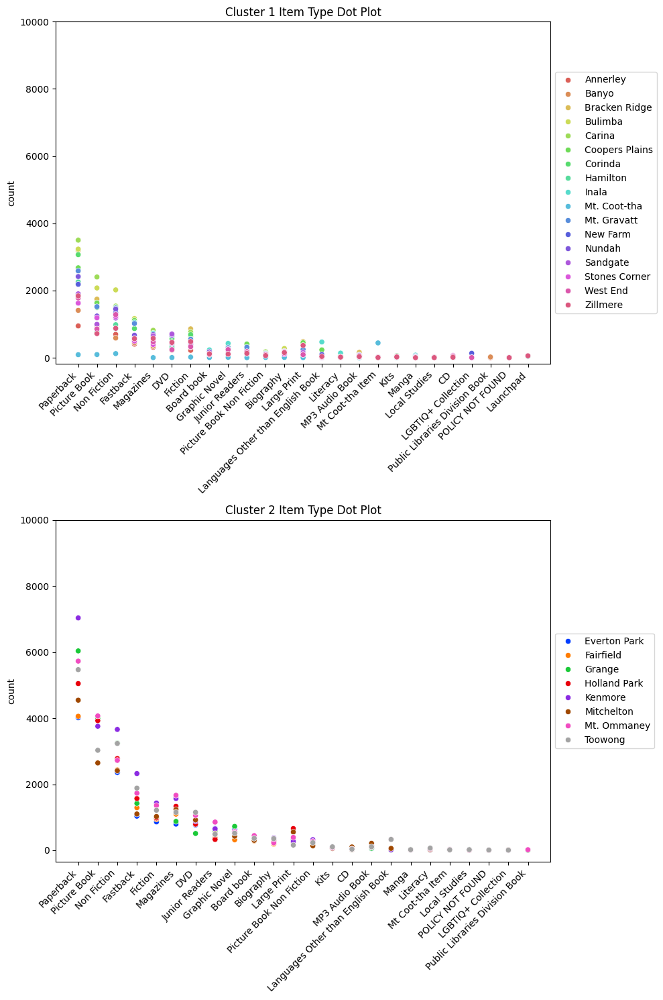

In [38]:
# Plot dot plot for clusters 1 and 2
clus_fig, clus_ax = plt.subplots(2,1, figsize = (10,15))

sns.scatterplot(lib_item2024[lib_item2024["Cluster"].isin(["1"])], 
                x = "Item Type", 
                y = "count", 
                hue = "Checkout Library", 
                palette = "hls", 
                ax = clus_ax[0])

clus_ax[0].set_xlabel(None)
clus_ax[0].set_title("Cluster 1 Item Type Dot Plot")
clus_ax[0].legend(loc='center left', bbox_to_anchor=(1, 0.5))
clus_ax[0].tick_params(axis = "x", labelrotation = 45)
clus_ax[0].set_xticks(clus_ax[0].get_xticks(), labels = lib_item2024["Item Type"].unique(), ha = "right")
clus_ax[0].set_yticks(item_graph.get_yticks()[1:-1])

sns.scatterplot(lib_item2024[lib_item2024["Cluster"].isin(["2"])], 
                x = "Item Type", 
                y = "count", 
                hue = "Checkout Library", 
                palette = "bright", 
                ax = clus_ax[1])

clus_ax[1].set_xlabel(None)
clus_ax[1].set_title("Cluster 2 Item Type Dot Plot")
clus_ax[1].legend(loc='center left', bbox_to_anchor=(1, 0.5))
clus_ax[1].set_yticks(item_graph.get_yticks()[1:-1])

plt.xticks(rotation = 45, ha = "right")

plt.tight_layout()

plt.show()

Other than the Mt Coot-tha library, the graphs do show more compact groupings and seems to reinforce the clustering. Overall, the greatest difference between libraries is observed in the Paperback and Picture Book types with Paperback being the strong favourite to the point that libraries with higher paperback counts typically end up having more counts overall than libraries with lower paperback counts (ie the difference isn't usually made up by a higher value in another item type).

**Language:**

The data also contains information about the Language the items are in which can provide insight into how LOTE materials are being used. The Brisbane City Council has assigned each LOTE item to a specific Library. The [Council Library eCatalog website](https://library-brisbane.ent.sirsidynix.net.au/client/en_AU/eLibCat) shows how many LOTE items each library has when filtering for LOTE items. If a library doesn't have a particular LOTE item it can be requested from another Library that does have it. 

The larger libraries will be compared on their LOTE item differences to search for further trends.

In [39]:
# Create a dataframe focusing on LOTE items sorted by Language and the number of checkouts
lib_lang2024 = lib2024[lib2024["Language"] != "POLICY NOT FOUND"]\
.merge(lib_cluster2024[["Checkout Library", "Cluster"]], on = "Checkout Library", how = "inner")

lib_lang2024 = lib_lang2024.groupby(["Language", "Cluster", "Checkout Library"]).agg({"Title": "count"})\
.reset_index().sort_values(by = ["Language","Title"]).rename(columns = {"Title": "Count"}).reset_index(drop = True)

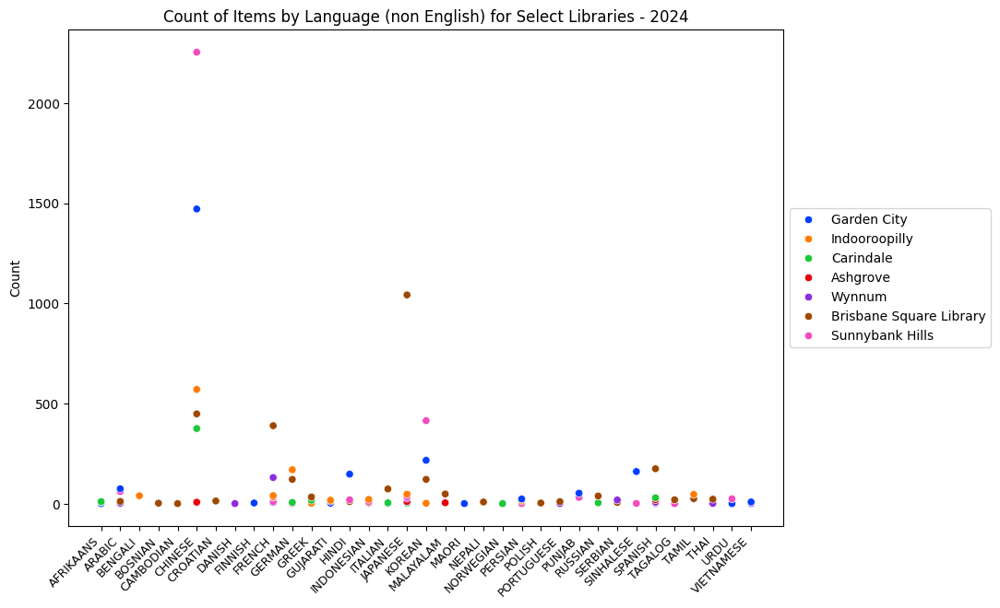

In [40]:
# Graph language data
plt.figure(figsize = (10,7))

lang_graph = sns.scatterplot(lib_lang2024[lib_lang2024["Cluster"].isin(["0","4","5"])], 
                             x = "Language", 
                             y = "Count", 
                             hue = "Checkout Library", 
                             palette = "bright")

plt.title("Count of Items by Language (non English) for Select Libraries - 2024")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.xticks(fontsize = 9, rotation = 45, ha = "right")
plt.xlabel(None)
plt.show()

The main differences come from Brisbane Square Library, the two libraries of Cluster 4 (Sunnybank Hills and Garden City) and Indooroopilly to a lesser extent. Sunnybank Hills is typically the higher count of the two with a few exceptions. Chinese is comfortably the highest checked out language according to the data. 

Brisbane Square Library's biggest difference is for Japanese items where it has over 1000 checkouts but every other library has very few. Sunnybank Hills library holds some events in Cantonese to cater for the large Chinese community there. This data suggests that something similar could be done in Brisbane Square Library for Japanese speakers.

Again, it is worth comparing this distribution with the distributions of the smaller libraries. As before, the data will be plotted on the same scale as above for comparison. 

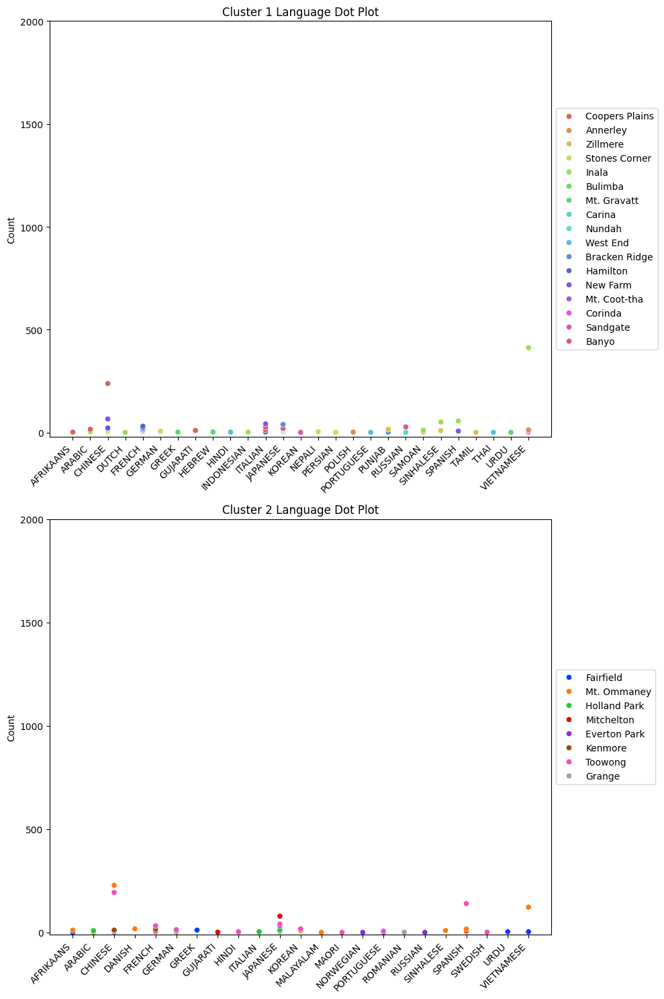

In [41]:
# Plot dot plot for clusters 1 and 2
clus_fig, clus_ax = plt.subplots(2,1, figsize = (10,15))

sns.scatterplot(lib_lang2024[lib_lang2024["Cluster"].isin(["1"])], 
                x = "Language", 
                y = "Count", 
                hue = "Checkout Library", 
                palette = "hls", 
                ax = clus_ax[0])

clus_ax[0].set_xlabel(None)
clus_ax[0].set_title("Cluster 1 Language Dot Plot")
clus_ax[0].legend(loc='center left', bbox_to_anchor=(1, 0.5))
clus_ax[0].tick_params(axis = "x", labelrotation = 45)
clus_ax[0].set_xticks(clus_ax[0].get_xticks(), labels = lib_lang2024[lib_lang2024["Cluster"].isin(["1"])]["Language"].unique(), ha = "right")
clus_ax[0].set_yticks(lang_graph.get_yticks()[1:-1])

sns.scatterplot(lib_lang2024[lib_lang2024["Cluster"].isin(["2"])], 
                x = "Language", 
                y = "Count", 
                hue = "Checkout Library", 
                palette = "bright", 
                ax = clus_ax[1])

clus_ax[1].set_xlabel(None)
clus_ax[1].set_title("Cluster 2 Language Dot Plot")
clus_ax[1].legend(loc='center left', bbox_to_anchor=(1, 0.5))
clus_ax[1].set_yticks(lang_graph.get_yticks()[1:-1])

plt.xticks(rotation = 45, ha = "right")
plt.tight_layout()

plt.show()

The smaller libraries have very few LOTE items checked out in comparison to the larger libraries, only a few libraries have enough counts to worth noting. Chinese, Spanish, and Vietnamese appear to be the prominent languages among the smaller libraries. 

The Vietnamese results are interesting as there were almost no items counted for the larger libraries for Vietnamese. Inala and Mt Ommaney make up most of the Vietnamese checkouts even though Inala is comfortably and consistently within the smallest libraries group. Again, this may be enough to warrant Vietnamese events to further cater for this community.

Since LOTE items are assigned to specific libraries it is worth comparing the number of LOTE items stored at a given library with the library's LOTE item checkout count to provide insight into whether these items are being used efficiently. The table below provides these numbers.

In [42]:
# count of LOTE items checked out at each library 
# that lists the total number of LOTE items at each library
lib_lang2024.groupby("Checkout Library")["Count"].sum().sort_values().reset_index().\
merge(total_items[["Library", "Total LOTE Items"]], how = "left", left_on = "Checkout Library", right_on = "Library").drop("Library", axis = 1).fillna(0)

,Checkout Library,Count,Total LOTE Items
0,Mt. Coot-tha,1,0
1,Sandgate,10,1
2,Carina,13,0
3,Corinda,16,0
4,Grange,18,0
5,Bulimba,18,0
6,Mt. Gravatt,23,0
7,Nundah,29,0
8,West End,30,1575
9,Annerley,33,0


The data shows that the bulk of the LOTE material is often kept at the libraries with by far the most LOTE checkouts. However, a clear outlier is the West End library which has 1575 items yet only 30 LOTE items were checked out for the entirety of 2024. 

According to the Library eCatalog, the West End library mostly holds Greek and Vietnamese items yet, as seen below, not a single Greek item was even checked out at this library and only one Vietnamese item was checked out in 2024. The few LOTE items that were checked out at West End library were primarily Chinese items and a few Spanish items. If LOTE items need to be kept at West End library then perhaps items of these languages would be a better fit.

The library with the most Greek checked out items (see below) is the Brisbane Square Library which the eCatalog claims does not store any Greek items. It also appears there are a number of libraries with a few Vietnamese checkouts (see further below). The data suggests that the LOTE items kept at the West End Library may be better used if distributed elsewhere.

It is possible that the eCatalog is simply wrong and needs to be updated but if these numbers are even remotely accurate then this data suggests a more efficient distribution is possible.

In [43]:
# LOTE items checked out from West End Library
lib_lang2024[lib_lang2024["Checkout Library"] == "West End"]

,Language,Cluster,Checkout Library,Count
39,CHINESE,1,West End,17
91,GERMAN,1,West End,1
130,HINDI,1,West End,2
144,ITALIAN,1,West End,1
230,PORTUGUESE,1,West End,1
270,SPANISH,1,West End,6
293,THAI,1,West End,1
306,VIETNAMESE,1,West End,1


In [44]:
# Greek checkouts for 2024
lib_lang2024[lib_lang2024["Language"] == "GREEK"]

,Language,Cluster,Checkout Library,Count
110,GREEK,1,New Farm,1
111,GREEK,1,Mt. Gravatt,2
112,GREEK,0,Indooroopilly,3
113,GREEK,2,Fairfield,12
114,GREEK,0,Carindale,18
115,GREEK,5,Brisbane Square Library,34


In [45]:
# Vietnamese checkouts for 2024
lib_lang2024[lib_lang2024["Language"] == "VIETNAMESE"]

,Language,Cluster,Checkout Library,Count
302,VIETNAMESE,0,Indooroopilly,1
303,VIETNAMESE,1,Bracken Ridge,1
304,VIETNAMESE,1,Corinda,1
305,VIETNAMESE,1,Mt. Gravatt,1
306,VIETNAMESE,1,West End,1
307,VIETNAMESE,2,Holland Park,1
308,VIETNAMESE,5,Wynnum,1
309,VIETNAMESE,1,Banyo,2
310,VIETNAMESE,2,Mitchelton,2
311,VIETNAMESE,2,Toowong,2


#### **Conclusion**

----

The data provided by the Brisbane City Council on library usage suggests that there are similarities in amongst the libraries that allow for groupings to be formed. The primary form of grouping is on the amount of checkouts the library produces. Libraries with higher checkout counts tend to have higher divergence from one another than the libraries with fewer checkouts. While there are some differences amonng the smaller libraries, the differences are much smaller in scale so they are more closly grouped together.

Within the larger libraries there are groupings that form based on the target audience age, the type of item, and the language the item is in. Sunnybank Hills and Garden City share similarities in their higher Juvenile item checkouts and their high number of Chinese item checkouts in particular. It would be worth investigating why these two libraries (that are geographically close) have more success with Juvenile checkouts.

Wynnum and Brisbane Square libraries diverge in the other direction with higher Adult checkouts. Brisbane Square Library is particularly distant from the other large libraries as it also has very low Paperback item type counts and high counts of Japanese items. More could be done to cater to the large Japanese community that attends the Brisbane Square library according to the data.

The distribution of LOTE items among the libraries appears suboptimal. Data for the West End library in particular suggests a redistribution of LOTE materials is needed. A better spread of LOTE materials could encourage people of those languages to use the library as they previously would need to go through the process of requesting the item if it wasn't at their local library or they would need to travel to a library that did. 